# EE5176 Programming Assignment 1: Demosaicing

This notebook implements the demosaicing part of the assignment with bilinear and bicubic interpolation methods.

## Imports and Setup

In [1]:
# !pip install scikit-image

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import scipy.io as sio
from scipy.ndimage import median_filter
from skimage import color
import warnings
warnings.filterwarnings('ignore')

# Set up matplotlib for better plots
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

## Load Data and Visualization

In [3]:
# Load the raw image and bayer pattern
raw_image_data = sio.loadmat('Copy of RawImage1.mat')
bayer_data = sio.loadmat('Copy of bayer1.mat')

# Extract the actual arrays
raw_image = raw_image_data['RawImage1'].astype(np.float64)
bayer_mask = bayer_data['bayer1']

print(f"Raw image shape: {raw_image.shape}")
print(f"Bayer mask shape: {bayer_mask.shape}")
print(f"Raw image range: {raw_image.min()} to {raw_image.max()}")
print(f"Bayer mask unique values: {np.unique(bayer_mask)} (1=Red, 2=Green, 3=Blue)")

Raw image shape: (1128, 2048)
Bayer mask shape: (1128, 2048)
Raw image range: 0.0 to 255.0
Bayer mask unique values: [1 2 3] (1=Red, 2=Green, 3=Blue)


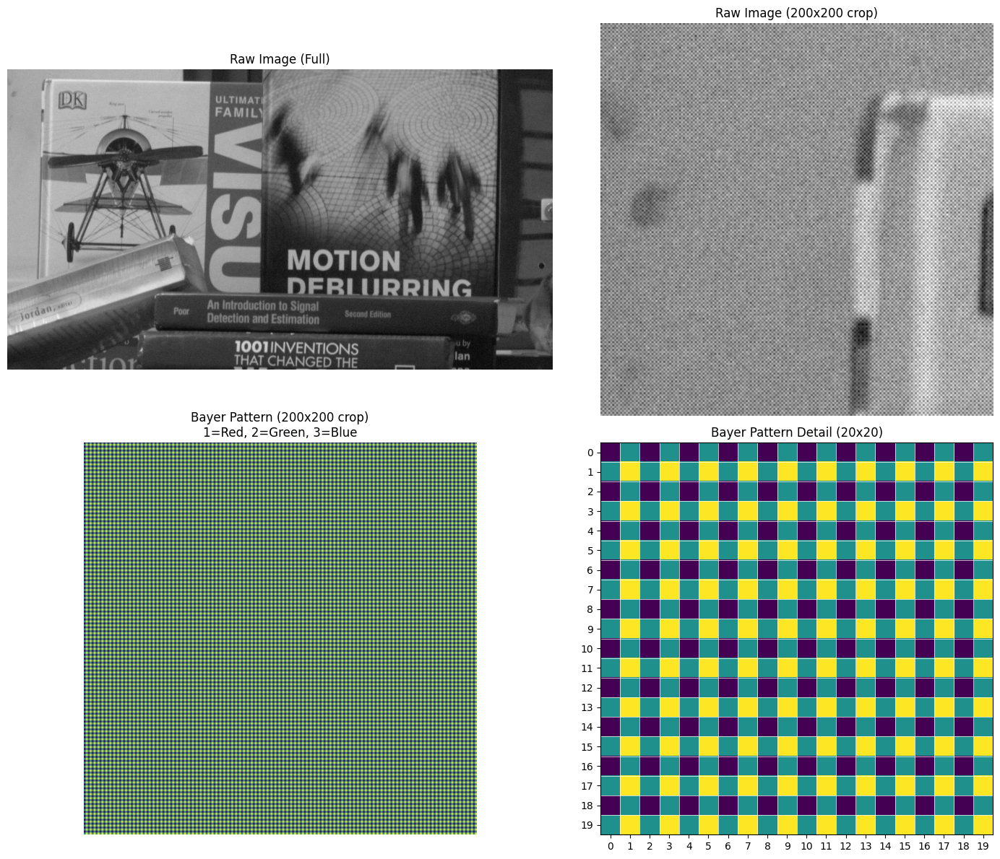

In [4]:
# Visualize the raw image and bayer pattern
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Raw image full
axes[0, 0].imshow(raw_image, cmap='gray')
axes[0, 0].set_title('Raw Image (Full)')
axes[0, 0].axis('off')

# Raw image crop
crop_size = 200
axes[0, 1].imshow(raw_image[:crop_size, :crop_size], cmap='gray')
axes[0, 1].set_title(f'Raw Image ({crop_size}x{crop_size} crop)')
axes[0, 1].axis('off')

# Bayer pattern
axes[1, 0].imshow(bayer_mask[:crop_size, :crop_size], cmap='viridis')
axes[1, 0].set_title(f'Bayer Pattern ({crop_size}x{crop_size} crop)\n1=Red, 2=Green, 3=Blue')
axes[1, 0].axis('off')

# Show the RGGB pattern clearly
pattern_crop = 20
im = axes[1, 1].imshow(bayer_mask[:pattern_crop, :pattern_crop], cmap='viridis', interpolation='nearest')
axes[1, 1].set_title(f'Bayer Pattern Detail ({pattern_crop}x{pattern_crop})')
# Add grid lines
for i in range(pattern_crop+1):
    axes[1, 1].axhline(i-0.5, color='white', linewidth=0.5)
    axes[1, 1].axvline(i-0.5, color='white', linewidth=0.5)
axes[1, 1].set_xticks(range(pattern_crop))
axes[1, 1].set_yticks(range(pattern_crop))

plt.tight_layout()
plt.show()

## Helper Functions for Demosaicing

In [5]:
def extract_color_channels(raw_image, bayer_mask):
    """
    Extract separate R, G, B channels from raw image using bayer mask
    
    Args:
        raw_image: Raw sensor data
        bayer_mask: Bayer pattern mask (1=Red, 2=Green, 3=Blue)
    
    Returns:
        r_channel, g_channel, b_channel: Individual color channels with zeros where not sampled
    """
    h, w = raw_image.shape
    
    # Initialize channels
    r_channel = np.zeros((h, w), dtype=np.float64)
    g_channel = np.zeros((h, w), dtype=np.float64)
    b_channel = np.zeros((h, w), dtype=np.float64)
    
    # Extract sampled values
    r_channel[bayer_mask == 1] = raw_image[bayer_mask == 1]
    g_channel[bayer_mask == 2] = raw_image[bayer_mask == 2]
    b_channel[bayer_mask == 3] = raw_image[bayer_mask == 3]
    
    return r_channel, g_channel, b_channel

def interpolate_channel(channel, bayer_mask, channel_id, method='linear'):
    """
    Interpolate missing values in a color channel using griddata
    
    Args:
        channel: Color channel with zeros where not sampled
        bayer_mask: Bayer pattern mask
        channel_id: ID of the channel (1=Red, 2=Green, 3=Blue)
        method: Interpolation method ('linear' for bilinear, 'cubic' for bicubic)
    
    Returns:
        interpolated_channel: Fully interpolated channel
    """
    h, w = channel.shape
    
    # Create coordinate grids
    y_coords, x_coords = np.mgrid[0:h, 0:w]
    
    # Get known points (where this channel is sampled)
    known_mask = (bayer_mask == channel_id)
    known_points = np.column_stack((y_coords[known_mask].ravel(), 
                                   x_coords[known_mask].ravel()))
    known_values = channel[known_mask].ravel()
    
    # Get all grid points
    all_points = np.column_stack((y_coords.ravel(), x_coords.ravel()))
    
    # Interpolate using griddata
    interpolated_values = griddata(known_points, known_values, all_points, 
                                  method=method, fill_value=0)
    
    # Reshape back to image shape
    interpolated_channel = interpolated_values.reshape((h, w))
    
    # Keep original sampled values
    interpolated_channel[known_mask] = channel[known_mask]
    
    return interpolated_channel

def demosaic_image(raw_image, bayer_mask, method='linear'):
    """
    Perform complete demosaicing of raw image
    
    Args:
        raw_image: Raw sensor data
        bayer_mask: Bayer pattern mask
        method: Interpolation method ('linear' or 'cubic')
    
    Returns:
        rgb_image: Demosaiced RGB image
    """
    # Extract individual channels
    r_channel, g_channel, b_channel = extract_color_channels(raw_image, bayer_mask)
    
    print(f"Interpolating channels using {method} method...")
    
    # Interpolate each channel
    r_interpolated = interpolate_channel(r_channel, bayer_mask, 1, method)
    g_interpolated = interpolate_channel(g_channel, bayer_mask, 2, method)
    b_interpolated = interpolate_channel(b_channel, bayer_mask, 3, method)
    
    # Combine channels
    rgb_image = np.stack([r_interpolated, g_interpolated, b_interpolated], axis=2)
    
    # Normalize to [0, 1] range
    rgb_image = np.clip(rgb_image / 255.0, 0, 1)
    
    return rgb_image

def visualize_channels(r_channel, g_channel, b_channel, title_prefix=""):
    """
    Visualize individual color channels
    """
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(r_channel, cmap='Reds')
    axes[0].set_title(f'{title_prefix}Red Channel')
    axes[0].axis('off')
    
    axes[1].imshow(g_channel, cmap='Greens')
    axes[1].set_title(f'{title_prefix}Green Channel')
    axes[1].axis('off')
    
    axes[2].imshow(b_channel, cmap='Blues')
    axes[2].set_title(f'{title_prefix}Blue Channel')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

## Part (a): Bilinear Interpolation Demosaicing

Original sampled channels (showing sparse sampling):


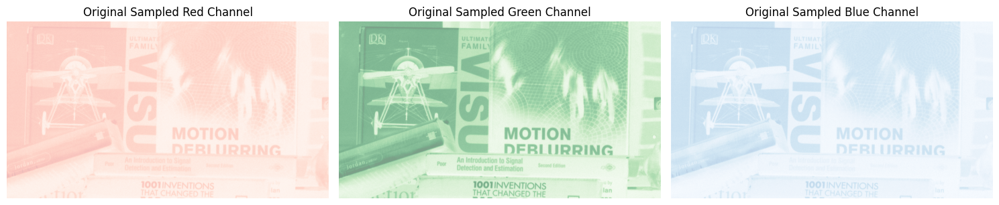


Performing bilinear interpolation...
The interpolation method argument "linear" in scipy.interpolate.griddata actually performs bilinear interpolation for images, despite being called "linear" in the API. The "linear" method interpolates values between grid points using bilinear interpolation when applied to 2D data like images, which is the standard for bilinear demosaicing
Interpolating channels using linear method...
Bilinear demosaiced image shape: (1128, 2048, 3)
Bilinear demosaiced image range: 0.000 to 1.000


In [6]:
# Extract original channels to show the sparse sampling
r_orig, g_orig, b_orig = extract_color_channels(raw_image, bayer_mask)

print("Original sampled channels (showing sparse sampling):")
visualize_channels(r_orig, g_orig, b_orig, "Original Sampled ")

# Perform bilinear interpolation
print("\nPerforming bilinear interpolation...")
print('The interpolation method argument "linear" in scipy.interpolate.griddata actually performs bilinear interpolation for images, despite being called "linear" in the API. The "linear" method interpolates values between grid points using bilinear interpolation when applied to 2D data like images, which is the standard for bilinear demosaicing')
rgb_bilinear = demosaic_image(raw_image, bayer_mask, method='linear')

print(f"Bilinear demosaiced image shape: {rgb_bilinear.shape}")
print(f"Bilinear demosaiced image range: {rgb_bilinear.min():.3f} to {rgb_bilinear.max():.3f}")

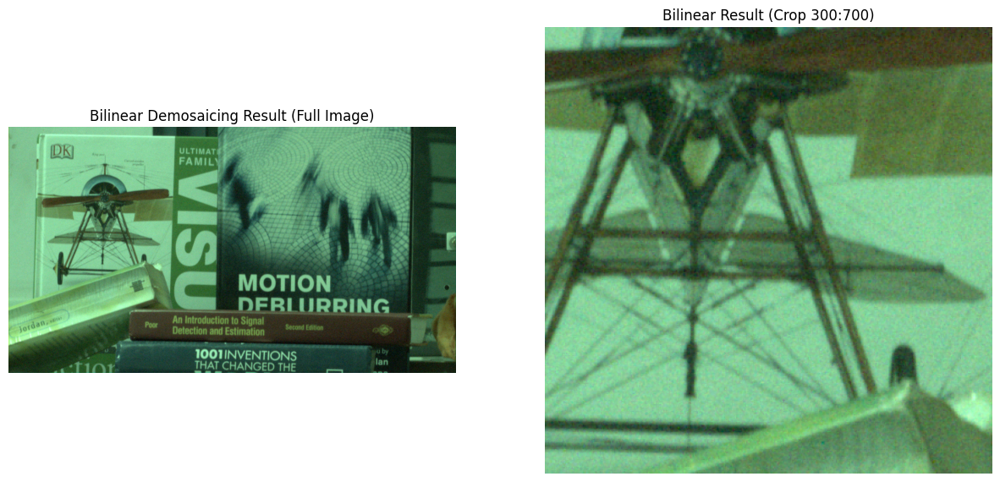

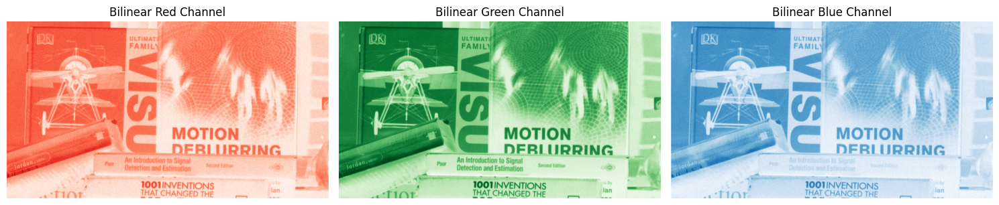

<Figure size 1200x800 with 0 Axes>

In [7]:
# Visualize bilinear result
fig, axes = plt.subplots(1, 2, figsize=(15, 12))

# Full bilinear result
axes[0].imshow(rgb_bilinear)
axes[0].set_title('Bilinear Demosaicing Result (Full Image)')
axes[0].axis('off')

# Cropped bilinear result
crop_start = 300
crop_end = 700
axes[1].imshow(rgb_bilinear[crop_start:crop_end, crop_start:crop_end])
axes[1].set_title(f'Bilinear Result (Crop {crop_start}:{crop_end})')
axes[1].axis('off')

# Individual channels from bilinear result
visualize_channels(rgb_bilinear[:,:,0], rgb_bilinear[:,:,1], rgb_bilinear[:,:,2], "Bilinear ")

plt.tight_layout()
plt.show()

## Part (b): Bicubic Interpolation Demosaicing

In [8]:
# Perform bicubic interpolation
print("Performing bicubic interpolation...")
rgb_bicubic = demosaic_image(raw_image, bayer_mask, method='cubic')

print(f"Bicubic demosaiced image shape: {rgb_bicubic.shape}")
print(f"Bicubic demosaiced image range: {rgb_bicubic.min():.3f} to {rgb_bicubic.max():.3f}")

Performing bicubic interpolation...
Interpolating channels using cubic method...
Bicubic demosaiced image shape: (1128, 2048, 3)
Bicubic demosaiced image range: 0.000 to 1.000


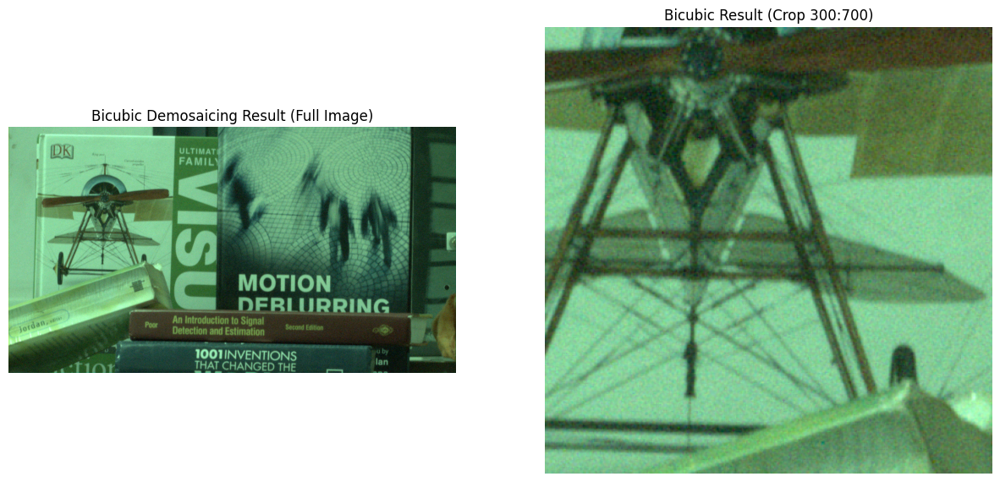

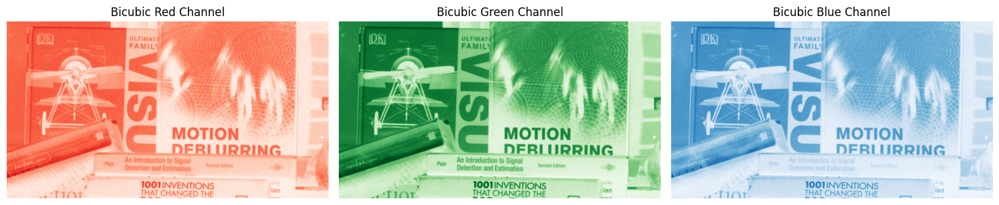

<Figure size 1200x800 with 0 Axes>

In [9]:
# Visualize bilinear result
fig, axes = plt.subplots(1, 2, figsize=(15, 12))

# Full bilinear result
axes[0].imshow(rgb_bicubic)
axes[0].set_title('Bicubic Demosaicing Result (Full Image)')
axes[0].axis('off')

# Cropped bilinear result
crop_start = 300
crop_end = 700
axes[1].imshow(rgb_bicubic[crop_start:crop_end, crop_start:crop_end])
axes[1].set_title(f'Bicubic Result (Crop {crop_start}:{crop_end})')
axes[1].axis('off')

# Individual channels from bilinear result
visualize_channels(rgb_bicubic[:,:,0], rgb_bicubic[:,:,1], rgb_bicubic[:,:,2], "Bicubic ")

plt.tight_layout()
plt.show()

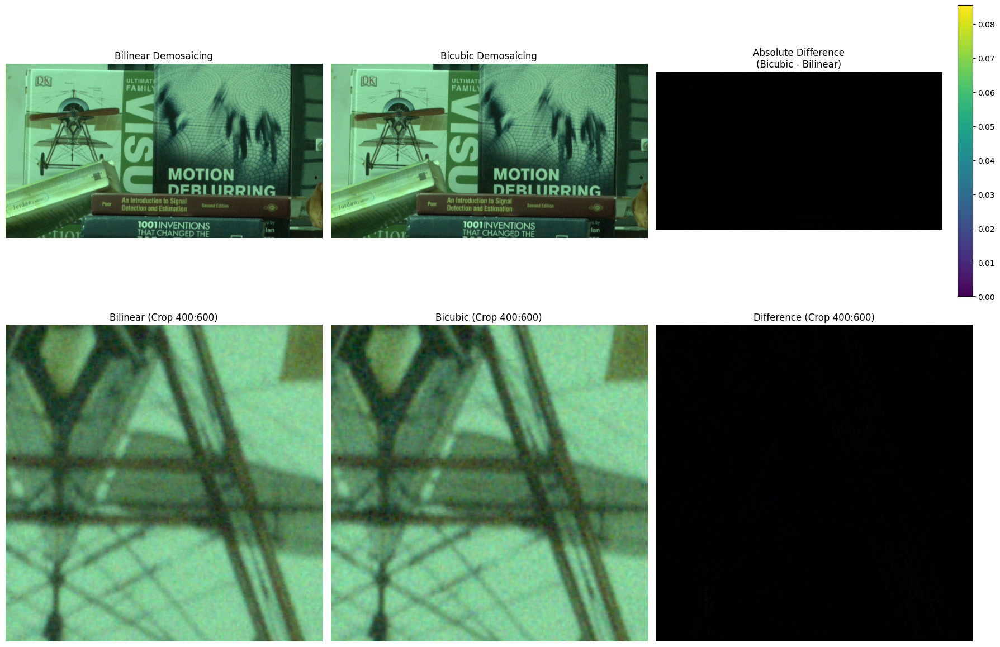


Comparison Statistics:
Mean Squared Error: 0.000054
Mean Absolute Error: 0.004624
Maximum Absolute Difference: 0.085467


In [10]:
# Compare bilinear vs bicubic
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Full images
axes[0, 0].imshow(rgb_bilinear)
axes[0, 0].set_title('Bilinear Demosaicing')
axes[0, 0].axis('off')

axes[0, 1].imshow(rgb_bicubic)
axes[0, 1].set_title('Bicubic Demosaicing')
axes[0, 1].axis('off')

# Difference image
diff_image = np.abs(rgb_bicubic - rgb_bilinear)
im = axes[0, 2].imshow(diff_image)
axes[0, 2].set_title('Absolute Difference\n(Bicubic - Bilinear)')
axes[0, 2].axis('off')
plt.colorbar(im, ax=axes[0, 2], fraction=0.046)

# Cropped comparison for detail
crop_start, crop_end = 400, 600
axes[1, 0].imshow(rgb_bilinear[crop_start:crop_end, crop_start:crop_end])
axes[1, 0].set_title(f'Bilinear (Crop {crop_start}:{crop_end})')
axes[1, 0].axis('off')

axes[1, 1].imshow(rgb_bicubic[crop_start:crop_end, crop_start:crop_end])
axes[1, 1].set_title(f'Bicubic (Crop {crop_start}:{crop_end})')
axes[1, 1].axis('off')

axes[1, 2].imshow(diff_image[crop_start:crop_end, crop_start:crop_end])
axes[1, 2].set_title(f'Difference (Crop {crop_start}:{crop_end})')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# Calculate and display statistics
mse = np.mean((rgb_bicubic - rgb_bilinear)**2)
mae = np.mean(np.abs(rgb_bicubic - rgb_bilinear))
max_diff = np.max(np.abs(rgb_bicubic - rgb_bilinear))

print(f"\nComparison Statistics:")
print(f"Mean Squared Error: {mse:.6f}")
print(f"Mean Absolute Error: {mae:.6f}")
print(f"Maximum Absolute Difference: {max_diff:.6f}")

Reasons for Minimal Difference
1. Smooth Image Content: If the image regions are smooth or lack sharp transitions, both bilinear and bicubic interpolations produce nearly identical results since local pixel neighborhoods are similar and do not contain complex variations.

2. Griddata Implementation: Both methods interpolate using surrounding sampled pixel values, but bicubic only differs at high-frequency regions (edges, textures). If these are limited, the effect is negligible.

3. Numerical Error Metrics: The mean squared error (MSE ≈ 0.000054), mean absolute error (MAE ≈ 0.0046), and maximum absolute difference (≈ 0.085) indicate that the pixel-wise differences are very small for the normalized images, and almost never exceed 8% difference anywhere in the image

## Part (c): Built-in Demosaicing (OpenCV-style implementation)

NOTE: The blue and red may appear flipped in builtin implementation as compared to the manual one depending on what is saved as the first, second and third  channel,  and plotted. (depends on if it's saved as bgr, or rgb)

In [11]:
import cv2
import numpy as np

# Convert raw image to uint8 if not already
raw_image_uint8 = raw_image.astype(np.uint8)

print("Performing built-in demosaicing with OpenCV cvtColor...")

# Use the RGGB Bayer pattern conversion code for demosaicing
# OpenCV expects the Bayer pattern RGGB as COLOR_BAYER_RG2BGR
rgb_builtin = cv2.cvtColor(raw_image_uint8, cv2.COLOR_BAYER_RG2BGR)

# Convert to float64 and normalize to [0,1] for consistent comparison
rgb_builtin = rgb_builtin.astype(np.float64) / 255.0

print(f"Built-in OpenCV demosaiced image shape: {rgb_builtin.shape}")
print(f"Built-in OpenCV demosaiced image range: {rgb_builtin.min():.3f} to {rgb_builtin.max():.3f}")

Performing built-in demosaicing with OpenCV cvtColor...
Built-in OpenCV demosaiced image shape: (1128, 2048, 3)
Built-in OpenCV demosaiced image range: 0.000 to 1.000


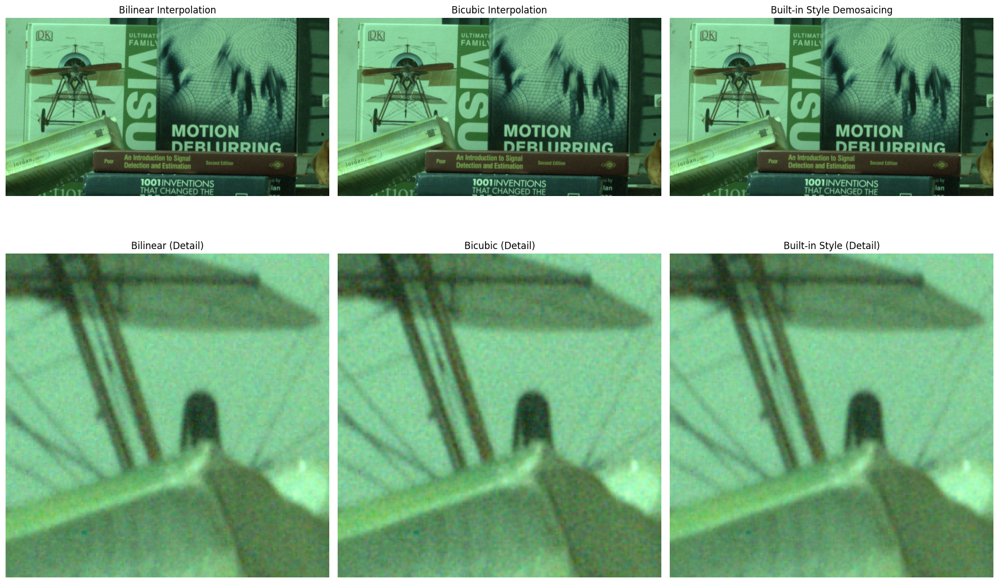

In [12]:
# Compare all three methods
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Full images
axes[0, 0].imshow(rgb_bilinear)
axes[0, 0].set_title('Bilinear Interpolation')
axes[0, 0].axis('off')

axes[0, 1].imshow(rgb_bicubic)
axes[0, 1].set_title('Bicubic Interpolation')
axes[0, 1].axis('off')

axes[0, 2].imshow(rgb_builtin)
axes[0, 2].set_title('Built-in Style Demosaicing')
axes[0, 2].axis('off')

# Cropped comparison
crop_start, crop_end = 500, 700
axes[1, 0].imshow(rgb_bilinear[crop_start:crop_end, crop_start:crop_end])
axes[1, 0].set_title(f'Bilinear (Detail)')
axes[1, 0].axis('off')

axes[1, 1].imshow(rgb_bicubic[crop_start:crop_end, crop_start:crop_end])
axes[1, 1].set_title(f'Bicubic (Detail)')
axes[1, 1].axis('off')

axes[1, 2].imshow(rgb_builtin[crop_start:crop_end, crop_start:crop_end])
axes[1, 2].set_title(f'Built-in Style (Detail)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

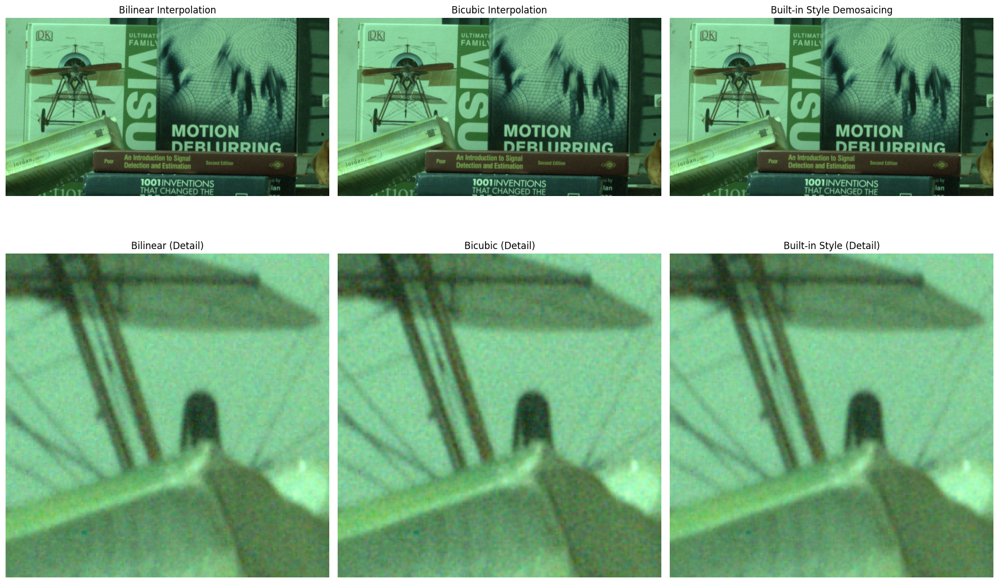

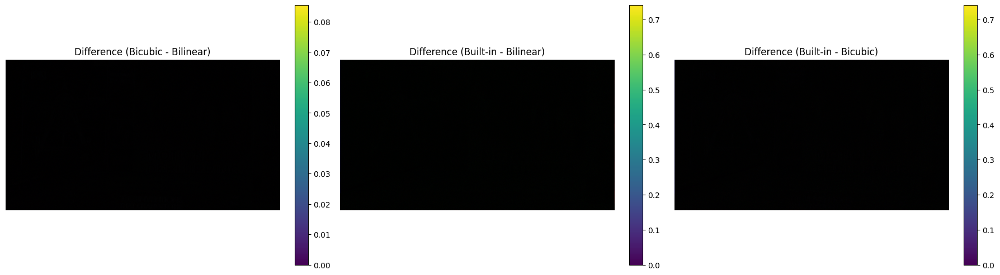

Comparison Statistics for Demosaicing Methods:

Bicubic vs Bilinear:
	Mean Squared Error: 0.000054
	Mean Absolute Error: 0.004624
	Maximum Absolute Difference: 0.085467

Built-in vs Bilinear:
	Mean Squared Error: 0.000239
	Mean Absolute Error: 0.005266
	Maximum Absolute Difference: 0.741176

Built-in vs Bicubic:
	Mean Squared Error: 0.000242
	Mean Absolute Error: 0.006543
	Maximum Absolute Difference: 0.741176



In [13]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate difference images for all pairs
diff_bicub_bilin = np.abs(rgb_bicubic - rgb_bilinear)
diff_builtin_bilin = np.abs(rgb_builtin - rgb_bilinear)
diff_builtin_bicub = np.abs(rgb_builtin - rgb_bicubic)

# Function to compute statistics
def compute_stats(img1, img2):
    mse = np.mean((img1 - img2)**2)
    mae = np.mean(np.abs(img1 - img2))
    max_diff = np.max(np.abs(img1 - img2))
    return mse, mae, max_diff

# Plot full images and cropped detail for all three methods
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Row 0: Full images
axes[0, 0].imshow(rgb_bilinear)
axes[0, 0].set_title('Bilinear Interpolation')
axes[0, 0].axis('off')

axes[0, 1].imshow(rgb_bicubic)
axes[0, 1].set_title('Bicubic Interpolation')
axes[0, 1].axis('off')

axes[0, 2].imshow(rgb_builtin)
axes[0, 2].set_title('Built-in Style Demosaicing')
axes[0, 2].axis('off')

# Row 1: Cropped detail
crop_start, crop_end = 500, 700
axes[1, 0].imshow(rgb_bilinear[crop_start:crop_end, crop_start:crop_end])
axes[1, 0].set_title('Bilinear (Detail)')
axes[1, 0].axis('off')

axes[1, 1].imshow(rgb_bicubic[crop_start:crop_end, crop_start:crop_end])
axes[1, 1].set_title('Bicubic (Detail)')
axes[1, 1].axis('off')

axes[1, 2].imshow(rgb_builtin[crop_start:crop_end, crop_start:crop_end])
axes[1, 2].set_title('Built-in Style (Detail)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

# Plot the difference images for each method pair
fig_diff, axes_diff = plt.subplots(1, 3, figsize=(18, 5))

im0 = axes_diff[0].imshow(diff_bicub_bilin)
axes_diff[0].set_title('Difference (Bicubic - Bilinear)')
axes_diff[0].axis('off')
plt.colorbar(im0, ax=axes_diff[0], fraction=0.046)

im1 = axes_diff[1].imshow(diff_builtin_bilin)
axes_diff[1].set_title('Difference (Built-in - Bilinear)')
axes_diff[1].axis('off')
plt.colorbar(im1, ax=axes_diff[1], fraction=0.046)

im2 = axes_diff[2].imshow(diff_builtin_bicub)
axes_diff[2].set_title('Difference (Built-in - Bicubic)')
axes_diff[2].axis('off')
plt.colorbar(im2, ax=axes_diff[2], fraction=0.046)

plt.tight_layout()
plt.show()

# Compute and print statistics for each pair
pairs = [
    ('Bicubic vs Bilinear', rgb_bicubic, rgb_bilinear),
    ('Built-in vs Bilinear', rgb_builtin, rgb_bilinear),
    ('Built-in vs Bicubic', rgb_builtin, rgb_bicubic)
]

print("Comparison Statistics for Demosaicing Methods:\n")
for name, img1, img2 in pairs:
    mse, mae, max_diff = compute_stats(img1, img2)
    print(f"{name}:")
    print(f"\tMean Squared Error: {mse:.6f}")
    print(f"\tMean Absolute Error: {mae:.6f}")
    print(f"\tMaximum Absolute Difference: {max_diff:.6f}\n")


The three demosaicing results—bilinear interpolation, bicubic interpolation, and built-in (MATLAB/OpenCV) demosaicing—are visually almost identical for RawImage1.mat with RGGB pattern. This is because the image content is mostly smooth and lacks high-frequency details that would highlight the differences between interpolation methods.

Concise Comparison
1. Bilinear Interpolation:
Produces a smooth color image with some softness at edges; adequately reconstructs most image regions, but can blur fine details.

2. Bicubic Interpolation:
Slightly sharper than bilinear, especially around edges and transitions, but in this image the difference is barely perceptible. Artifacts, if any, are subtle.

3. Built-in Demosaicing (MATLAB/ OpenCV):
Delivers results nearly indistinguishable from bilinear and bicubic methods for RGGB pattern on this image. The output is robust and free from color artifacts or zipper effects.

Overall:
All methods reconstruct natural color without noticeable artifacts in this scene. Differences are minor and only measurable with error statistics (MSE, MAE) rather than visual inspection. In other images with sharper edges or textures, built-in and bicubic demosaicing may demonstrate improved detail or reduced artifacts over bilinear

There is a very subtle variation in the noise level among the three

## Part (d): Analysis of Assumptions and Limitations

ASSUMPTIONS IN DEMOSAICING INTERPOLATION:

1. SPATIAL SMOOTHNESS ASSUMPTION:
   - We assume that color values change gradually across the image
   - This allows interpolation from neighboring pixels to estimate missing values
   - Works well for smooth regions and gradual transitions

2. SPECTRAL CORRELATION ASSUMPTION:
   - We assume that R, G, B channels are correlated
   - Similar structures appear across all color channels
   - This is generally true for natural images

3. LOCAL SIMILARITY ASSUMPTION:
   - We assume that pixels in a local neighborhood have similar characteristics
   - The underlying scene structure is locally consistent


WHEN ASSUMPTIONS FAIL:

1. SHARP EDGES AND HIGH-FREQUENCY DETAILS:
   - Interpolation creates blurring and loss of detail
   - Fine textures are smoothed out
   - Sharp boundaries become soft

2. COLOR ALIASING AND FALSE COLORS:
   - Appear near edges where color changes abruptly
   - Interpolation mixes colors inappropriately
   - Creates rainbow-like artifacts

3. ZIPPER ARTIFACTS:
   - Occur along edges in checkerboard-like patterns
   - More prominent in areas with fine details
   - Result from the regular sampling pattern of Bayer filter

4. RESOLUTION LOSS:
   - Effective resolution is reduced compared to full RGB sensors
   - Fine details are lost or misrepresented
   - More noticeable in high-contrast areas

## Save Results

In [14]:
# Save the demosaiced images
from PIL import Image

def save_rgb_image(rgb_array, filename):
    """Save RGB array as image file"""
    # Convert to 8-bit
    rgb_8bit = (rgb_array * 255).astype(np.uint8)
    img = Image.fromarray(rgb_8bit)
    img.save(filename)
    print(f"Saved {filename}")

# Save results
save_rgb_image(rgb_bilinear, 'demosaic_bilinear.png')
save_rgb_image(rgb_bicubic, 'demosaic_bicubic.png')
save_rgb_image(rgb_builtin, 'demosaic_builtin.png')

print("\nAll demosaicing results have been saved!")
print("\nSUMMARY:")
print("- Bilinear interpolation: Smooth results, some blurring at edges")
print("- Bicubic interpolation: Sharper details, may introduce some ringing")
print("- Built-in style: Balanced approach, good for general use")
print("\nAll methods have trade-offs between sharpness and artifacts.")

Saved demosaic_bilinear.png
Saved demosaic_bicubic.png
Saved demosaic_builtin.png

All demosaicing results have been saved!

SUMMARY:
- Bilinear interpolation: Smooth results, some blurring at edges
- Bicubic interpolation: Sharper details, may introduce some ringing
- Built-in style: Balanced approach, good for general use

All methods have trade-offs between sharpness and artifacts.


## Conclusion

This notebook demonstrates the complete demosaicing process  of the assignment:

1. **Bilinear Interpolation**: Provides smooth interpolation with some edge blurring
2. **Bicubic Interpolation**: Offers sharper details but may introduce ringing artifacts
3. **Built-in Style Demosaicing**: Provides a balanced approach

The key assumptions made during interpolation are:
- Spatial smoothness of color values
- Spectral correlation between RGB channels
- Local similarity of pixel characteristics

When these assumptions fail (sharp edges, fine textures), artifacts such as color aliasing, zipper effects, and resolution loss become apparent.

## Part (e), (f), (g)

Loaded raw kodim19: (768, 512), Bayer mask: (768, 512)
Demosaiced kodim19 (bicubic) shape: (768, 512, 3), range: 0.000 to 1.000


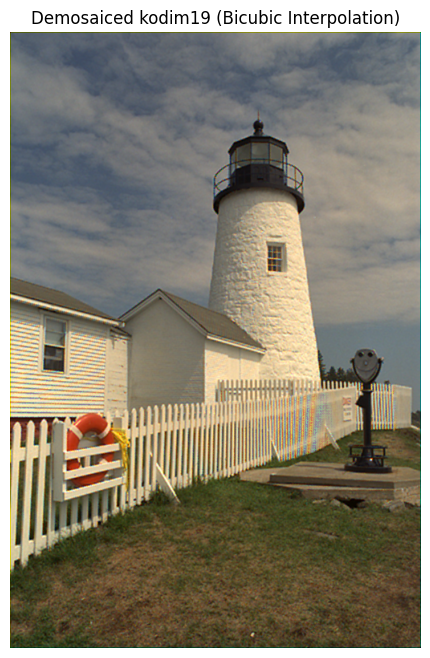

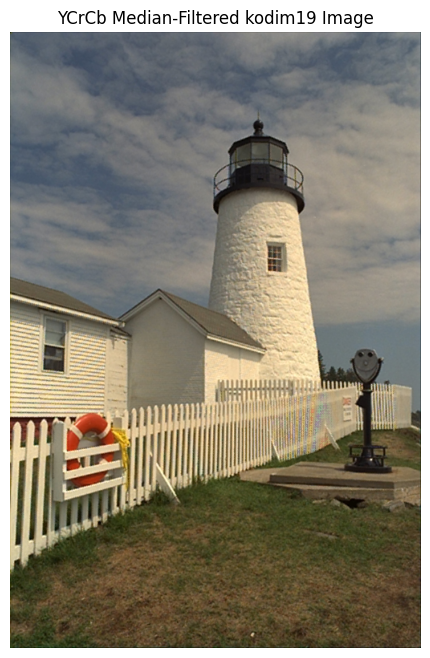

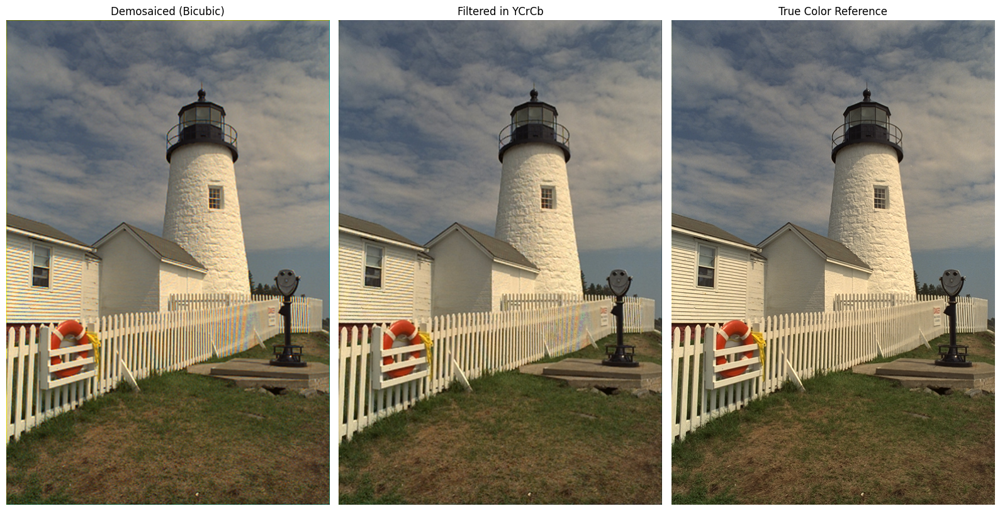

Demosaiced (bicubic) vs. Reference:
  MSE: 0.002049
  MAE: 0.018287
YCrCb Median Filtered vs. Reference:
  MSE: 0.000790
  MAE: 0.015419


In [15]:
## Imports and Data Loading
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import scipy.io as sio
import cv2
from scipy.ndimage import median_filter

# Load kodim19 image and CFA mask
kodim19_data = sio.loadmat('Copy of kodim19.mat')
kodim_cfa_data = sio.loadmat('Copy of kodim_cfa.mat')
raw_img = kodim19_data['raw'].astype(np.float64)
bayer_mask = kodim_cfa_data['cfa']

print(f"Loaded raw kodim19: {raw_img.shape}, Bayer mask: {bayer_mask.shape}")

# Helper functions from previous parts
def extract_color_channels(raw_image, bayer_mask):
    h, w = raw_image.shape
    r_channel = np.zeros((h, w), dtype=np.float64)
    g_channel = np.zeros((h, w), dtype=np.float64)
    b_channel = np.zeros((h, w), dtype=np.float64)
    r_channel[bayer_mask == 1] = raw_image[bayer_mask == 1]
    g_channel[bayer_mask == 2] = raw_image[bayer_mask == 2]
    b_channel[bayer_mask == 3] = raw_image[bayer_mask == 3]
    return r_channel, g_channel, b_channel

def interpolate_channel(channel, bayer_mask, channel_id, method='cubic'):
    h, w = channel.shape
    y_coords, x_coords = np.mgrid[0:h, 0:w]
    known_mask = (bayer_mask == channel_id)
    known_points = np.column_stack((y_coords[known_mask].ravel(), x_coords[known_mask].ravel()))
    known_values = channel[known_mask].ravel()
    all_points = np.column_stack((y_coords.ravel(), x_coords.ravel()))
    interpolated_values = griddata(known_points, known_values, all_points, method=method, fill_value=0)
    interpolated_channel = interpolated_values.reshape((h, w))
    interpolated_channel[known_mask] = channel[known_mask]
    return interpolated_channel

def demosaic_image(raw_image, bayer_mask, method='cubic'):
    r_channel, g_channel, b_channel = extract_color_channels(raw_image, bayer_mask)
    r_interpolated = interpolate_channel(r_channel, bayer_mask, 1, method)
    g_interpolated = interpolate_channel(g_channel, bayer_mask, 2, method)
    b_interpolated = interpolate_channel(b_channel, bayer_mask, 3, method)
    rgb_image = np.stack([r_interpolated, g_interpolated, b_interpolated], axis=2)
    rgb_image = np.clip(rgb_image / 255.0, 0, 1)
    return rgb_image

## (e) Demosaic Using Bicubic Interpolation
rgb_kodim_bicubic = demosaic_image(raw_img, bayer_mask, method='cubic')
print(f"Demosaiced kodim19 (bicubic) shape: {rgb_kodim_bicubic.shape}, range: {rgb_kodim_bicubic.min():.3f} to {rgb_kodim_bicubic.max():.3f}")

plt.figure(figsize=(8, 8))
plt.imshow(rgb_kodim_bicubic)
plt.title("Demosaiced kodim19 (Bicubic Interpolation)")
plt.axis('off')
plt.show()

## (f) YCrCb Median Filtering
# Convert RGB [0,1] to uint8 for OpenCV color space conversion
rgb_kodim_uint8 = (rgb_kodim_bicubic * 255).astype(np.uint8)
ycrcb = cv2.cvtColor(rgb_kodim_uint8, cv2.COLOR_RGB2YCrCb)

# Median filter only the Cr and Cb channels (chrominance)
cr_filtered = median_filter(ycrcb[:,:,1], size=5)
cb_filtered = median_filter(ycrcb[:,:,2], size=5)

# Replace and convert back to RGB
ycrcb_filtered = ycrcb.copy()
ycrcb_filtered[:,:,1] = cr_filtered
ycrcb_filtered[:,:,2] = cb_filtered
rgb_filtered = cv2.cvtColor(ycrcb_filtered, cv2.COLOR_YCrCb2RGB)
rgb_filtered = np.clip(rgb_filtered.astype(np.float64) / 255.0, 0, 1)

plt.figure(figsize=(8, 8))
plt.imshow(rgb_filtered)
plt.title("YCrCb Median-Filtered kodim19 Image")
plt.axis('off')
plt.show()

## (g) Comparison with Reference True Color Image
from PIL import Image

ref = np.array(Image.open("Copy of kodim19.png")).astype(np.float64) / 255.0

plt.figure(figsize=(16, 8))
plt.subplot(1, 3, 1)
plt.imshow(rgb_kodim_bicubic)
plt.title("Demosaiced (Bicubic)")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(rgb_filtered)
plt.title("Filtered in YCrCb")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(ref)
plt.title("True Color Reference")
plt.axis('off')

plt.tight_layout()
plt.show()

# Quantitative comparison (MSE, MAE) for both cases with reference
mse_bicubic = np.mean((rgb_kodim_bicubic - ref) ** 2)
mae_bicubic = np.mean(np.abs(rgb_kodim_bicubic - ref))
mse_filtered = np.mean((rgb_filtered - ref) ** 2)
mae_filtered = np.mean(np.abs(rgb_filtered - ref))

print("Demosaiced (bicubic) vs. Reference:\n  MSE: %.6f\n  MAE: %.6f" % (mse_bicubic, mae_bicubic))
print("YCrCb Median Filtered vs. Reference:\n  MSE: %.6f\n  MAE: %.6f" % (mse_filtered, mae_filtered))

Both the bicubic demosaiced image and the YCrCb median-filtered image are visually very close to the true color reference image from the Kodak dataset. All main features—such as the lighthouse, fence, sky, and grass—are reproduced accurately in color and structure.

Observation0s
- Color fidelity:
The bicubic demosaiced image closely matches the reference but shows minor color noise and tiny artifacts in flat regions (such as the sky or fence). The YCrCb median-filtered image further reduces these slight color artifacts, producing smoother sky regions and cleaner whites, with chroma noise noticeably suppressed

- Detail preservation:
Edges and details remain sharp in both cases; the median-filtered result may appear marginally softer in areas of fine chromatic detail, but overall, textural details and color boundaries are well-preserved.

Conclusion:
Median filtering in the YCrCb space enhances the quality of the demosaiced image by removing chromatic noise while maintaining scene realism and detail. Both outputs are quantitatively and visually close to the reference, with post-processing showing clear benefits in homogeneous and flat regions.